In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

In [2]:
train_df = pd.read_csv("./dataset/train.csv")
test_df = pd.read_csv("./dataset/test.csv")

FileNotFoundError: [Errno 2] No such file or directory: './dataset/train.csv'

In [ ]:
print('train shape: {:}'.format(train_df.shape))
print('test shape:{:}'.format(test_df.shape))

---
# Series data

some note of the features
+ enmo:
  + Detecting periods of no motion: If the ENMO value is zero, it indicates that the accelerometer is stationary.
  + ctivity recognition: ENMO values above zero can be used to infer activity levels. Higher values typically correspond to more intense movements.
  + Feature extraction for machine learning: ENMO can be used as one of the features in machine learning models to classify activities (walking, running, standing still, etc.)
  
+ anglez:
  + Posture analysis: Angle-Z helps identify if the arm is inclined or held horizontally, useful for detecting specific arm positions or postures.
  + Activity recognition: Angle-Z can help differentiate between various arm positions associated with specific activities (e.g., holding a phone versus swinging the arm while walking).
  + Gesture analysis: In some applications, changes in Angle-Z over time can reveal gestural patterns or movement routines.

+ 



Classify the data according to there sii level

In [5]:
from pathlib import Path

In [6]:
SERIES_TRAIN_DIR = './dataset/series_train.parquet'
main_folder = Path(SERIES_TRAIN_DIR)

sii_count = [0,0,0,0]
sii_ids = [[],[],[],[]]
sii_file_path = [[],[],[],[]]
for _,sub_folder in enumerate (main_folder.iterdir()):
    for path in sub_folder.iterdir():
        participant = sub_folder.name.split('=')[1]
        sii = train_df.loc[train_df['id']==participant,'sii']
        if(sii.shape[0] !=0):
            sii_count[int(sii.squeeze())]+=1
            sii_ids[int(sii.squeeze())].append(participant)
            sii_file_path[int(sii.squeeze())].append(str(path))

NONE_PATHS = sii_file_path[0]
NONE_IDS = sii_ids[0]

MILD_PATHS = sii_file_path[1]
MILD_IDS = sii_ids[1]

MODERATE_PATHS = sii_file_path[2]
MODERATE_IDS = sii_ids[2]

SEVERE_PATHS = sii_file_path[3]
SEVERE_IDS = sii_ids[3]

In [7]:
print('sii_0: {:}, sii_1: {:}, sii_2: {:}, sii_3: {:}'.format(sii_count[0],sii_count[1],sii_count[2],sii_count[3]))

sii_0: 583, sii_1: 266, sii_2: 137, sii_3: 10


In [8]:
def load_data(path):
    df = pd.read_parquet(path)
    return df

---
# Some visualization

In [9]:
def plot_series(df,fontsize=50):
    columns = df.columns.tolist()
    step = df[columns[0]].tolist()
    rows = len(columns)-1
    plt.figure(figsize=(100,70))
    for _,col in enumerate(columns[1:]):
        plt.subplot(rows,1,_+1)
        plt.plot(step,df[col].tolist())
        plt.title(col, fontsize=fontsize)

**A sample that sii = 0**

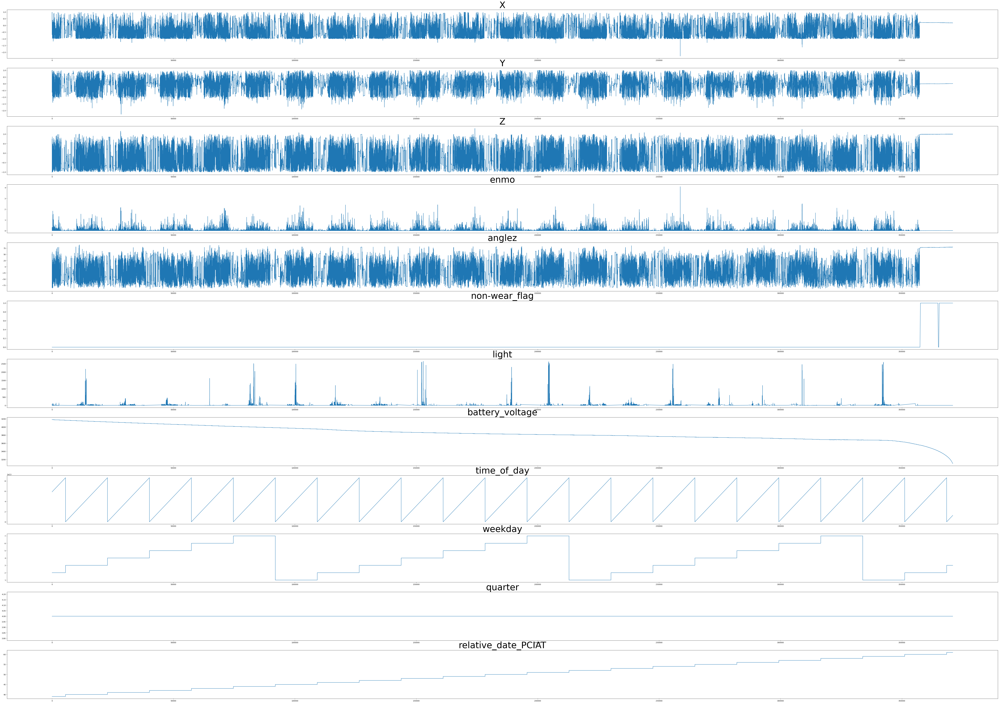

In [72]:
plot_series(load_data(NONE_PATHS[0]))

**A sample that sii = 1**

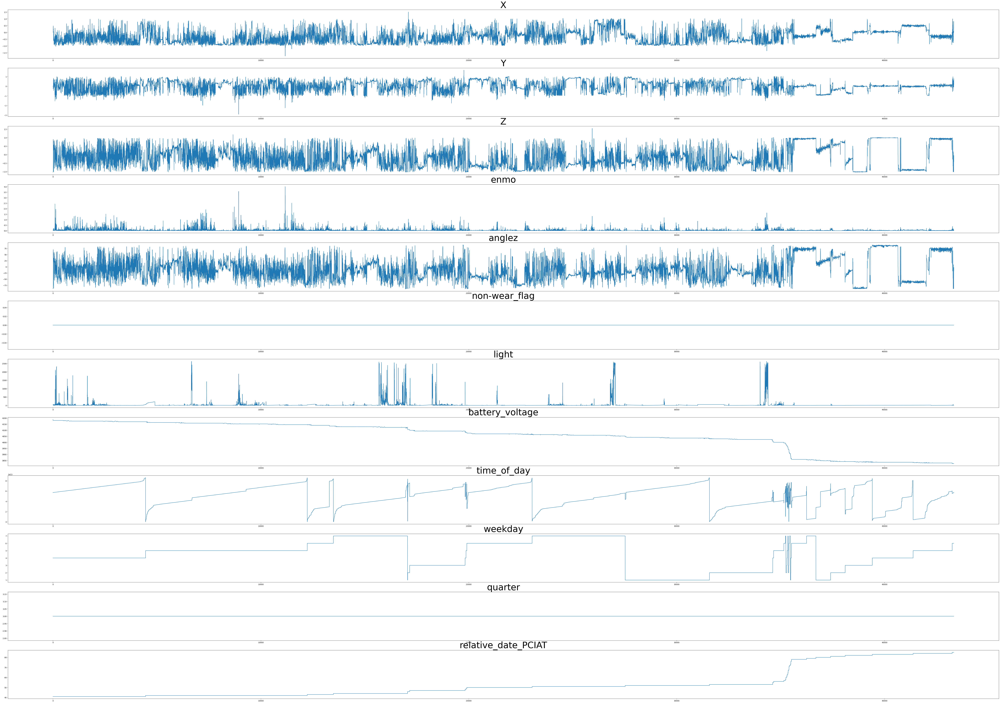

In [73]:
plot_series(load_data(MILD_PATHS[0]))

**A sample that sii = 2**

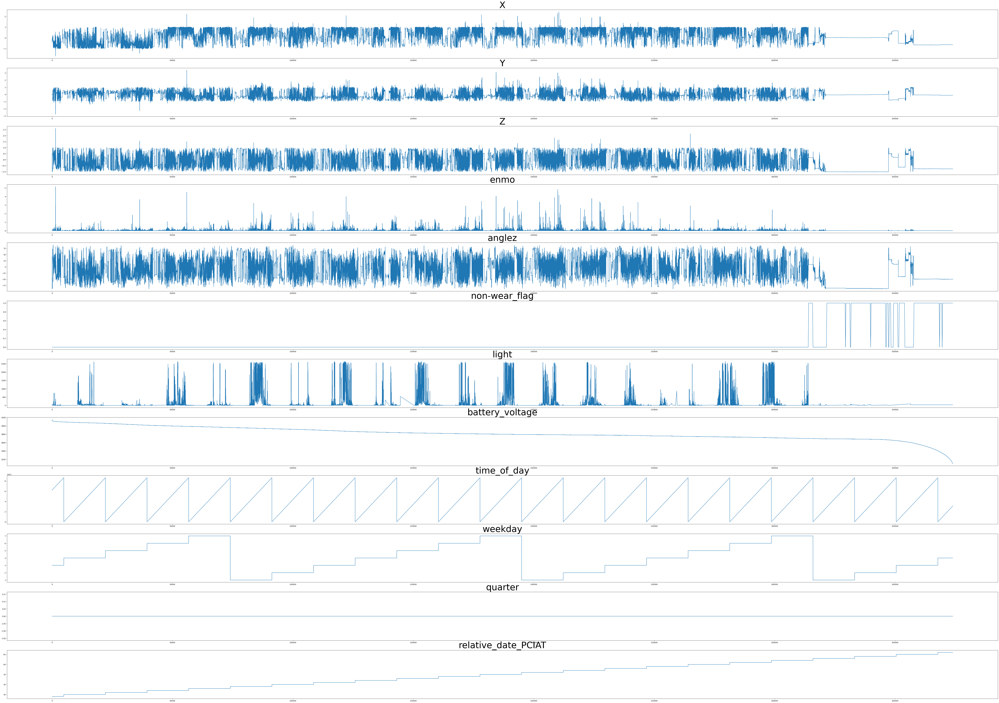

In [74]:
plot_series(load_data(MODERATE_PATHS[5]))

**A sample that sii = 3**

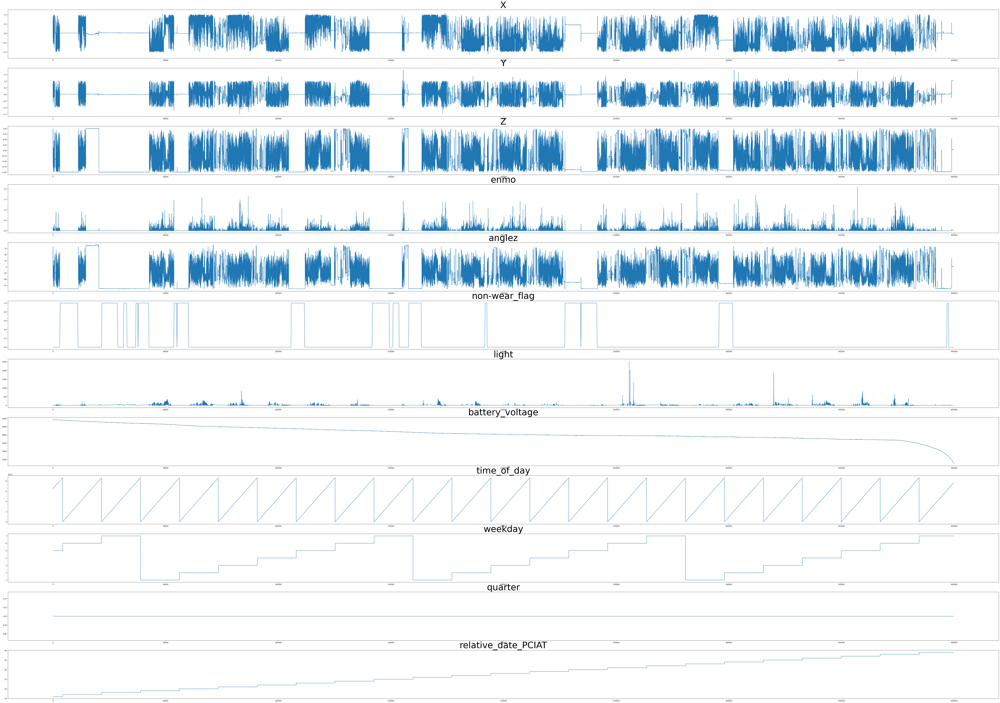

In [75]:
plot_series(load_data(SEVERE_PATHS[9]))

1. ```X```,```Y```,```Z``` data maybe contain a lot of noize, which need denosing.
2. Not all the participant wear the watch all the time. Maybe drop the data where ```non_wear_flag```=1.
3. ```battery_voltage``` maybe is not a important feature.
4. Maybe there is correlation between hand movement and ```time_of_day``` and ```week_day```.
5. ```quarter``` maybe is not a important feature
6. ```rative_data_PCIAT``` maybe is not a important feature.

TODO
 
1. drop out all the data when non_wear_flag = 1
2. denoising
4. cacluate if there is correlation between data

---
# **Preprocessing** 

1. Drop out all the time series when non_wear_flag = 1
2. Drop out column ```battery_voltage``` ,```quarter```, ```relative_date_PCIAT```

Used ```NONE_PATH[0]``` as example.

In [10]:
df = load_data(NONE_PATHS[0])
print('orginal shape: {:}'.format(df.shape))
df.head()

orginal shape: (370956, 13)


,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.294667,0.307097,-1.022549,0.307828,-60.737103,0.0,28.000000,4184.000000,58680000000000,2,4,39.0
1,1,-0.121981,0.903011,-0.297953,0.195007,-13.897434,0.0,89.199997,4183.666504,58685000000000,2,4,39.0
2,2,0.014177,0.981547,-0.157197,0.039010,-9.371251,0.0,80.800003,4183.333496,58690000000000,2,4,39.0
3,3,-0.165815,0.754831,0.580785,0.099852,36.823677,0.0,9.500000,4183.000000,58695000000000,2,4,39.0
4,4,-0.401472,-0.326161,0.702366,0.058624,48.882442,0.0,1.666667,4182.666504,58700000000000,2,4,39.0


In [11]:
def drop_non_wear_time(df):
    return df[df['non-wear_flag']==0.0]    

preprocessing shape: (357626, 10)


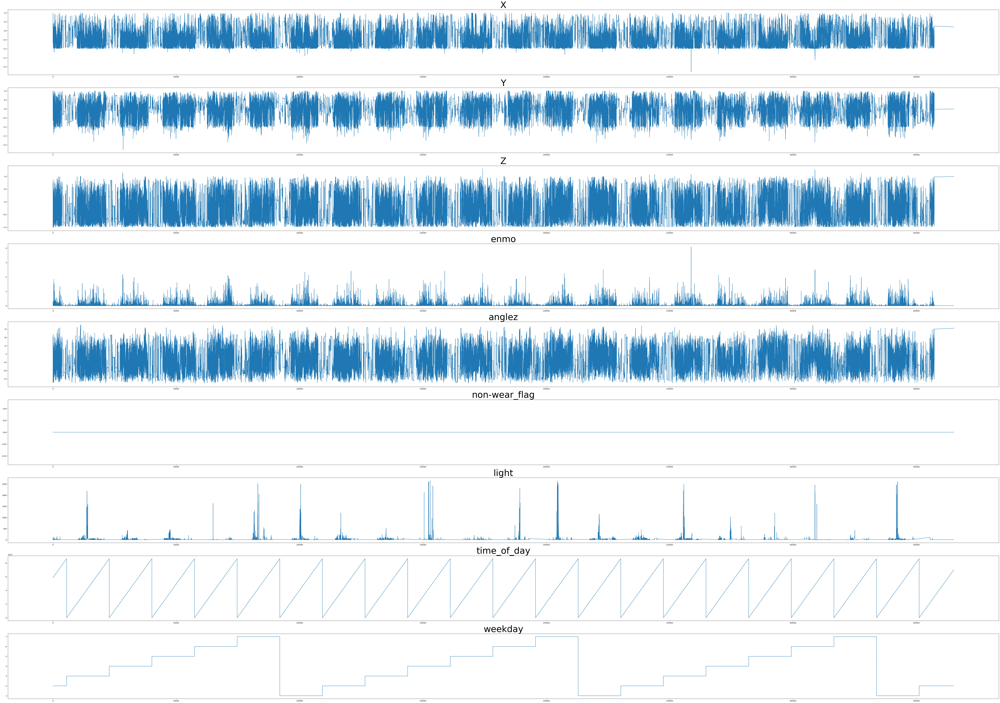

In [12]:
df.drop(columns=['battery_voltage'], inplace=True)
df.drop(columns=['quarter'], inplace=True )
df.drop(columns=['relative_date_PCIAT'], inplace=True)
df = drop_non_wear_time(df)
print('preprocessing shape: {:}'.format(df.shape))
plot_series(df)

---
# **Denoising**

## Low-Pass Filter 
<p style="text-align:center;"> $ y_t = \alpha x_t + (1 - \alpha) y_{t-1} $ </p>

In [62]:
def loss_pass_filter(data,alpha=0.2):
    data_filtered = [data[0]]
    for i in range(1,len(data)):
        data_filtered.append(alpha*data[i]+(1-alpha)*data_filtered[i-1])
    return data_filtered
    

In [67]:
df['X_low'] = loss_pass_filter(df['X'].to_numpy())
df['Y_low'] = loss_pass_filter(df['Y'].to_numpy())
df['Z_low'] = loss_pass_filter(df['Z'].to_numpy())

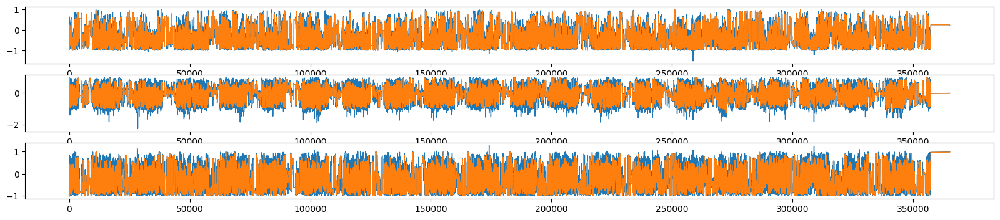

In [79]:
step = df['step']
plt.figure(figsize=(20,4))
plt.subplot(3,1,1)
plt.plot(step,df['X'],linewidth=1)
plt.plot(step,df['X_low'],linewidth=1)
plt.subplot(3,1,2)
plt.plot(step,df['Y'],linewidth=1)
plt.plot(step,df['Y_low'],linewidth=1)
plt.subplot(3,1,3)
plt.plot(step,df['Z'],linewidth=1)
plt.plot(step,df['Z_low'],linewidth=1)
plt.show()

## High-Pass Filter
<p style="text-align:center;"> $ y_t = x_t - (\alpha x_t+ (1 - \alpha) y_{t-1})$ </p>

In [73]:
def hight_pass_filter(data, alpha=0.2):
    data_filtered = [data[0]]
    for i in range (1, len(data)):
        data_filterd.append(data[i] - (alpha*data[i]+(1-alpha)*data_filtered[i-1]))

In [85]:
df['X_high'] = df['X'].to_numpy()-df['X_low'].to_numpy()
df['Y_high'] = df['Y'].to_numpy()-df['Y_low'].to_numpy()
df['Z_high'] = df['Z'].to_numpy()-df['Z_low'].to_numpy()

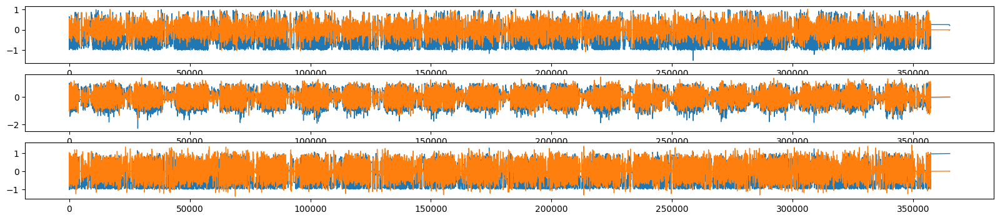

In [86]:
step = df['step']
plt.figure(figsize=(20,4))
plt.subplot(3,1,1)
plt.plot(step,df['X'],linewidth=1)
plt.plot(step,df['X_high'],linewidth=1)
plt.subplot(3,1,2)
plt.plot(step,df['Y'],linewidth=1)
plt.plot(step,df['Y_high'],linewidth=1)
plt.subplot(3,1,3)
plt.plot(step,df['Z'],linewidth=1)
plt.plot(step,df['Z_high'],linewidth=1)
plt.show()